**this is an unorganized mess of code from the initial exploration of the project. Please refer to the other notebooks for a more organized and up to date exploration**

In [1]:
import math 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
from datetime import datetime
from meteostat import Point, Daily

import matplotlib.colors as colors
import matplotlib.cm as cm
import osmnx as ox
import networkx as nx

import geopandas as gpd
import shapely.geometry

pd.set_option('display.max_columns', None)

In [28]:
import os
print(os.getcwd())

d:\Documents\School\GYear 2\Urban\project


# 0: Loading data

Load data from APIs

In [ ]:
from sodapy import Socrata

# CONSTANTS
DATASET_ID = "erm2-nwe9"  # NYC 311 Service Requests ID
APP_TOKEN = None          # Optional: Sign up for an app token at NYC Open Data for higher limits

def get_311_data(start_date="2023-01-01", end_date="2025-01-01", limit=10000):
    """
    Fetches 311 data using the Socrata API.
    """
    client = Socrata("data.cityofnewyork.us", APP_TOKEN)
    
    # SoQL Query: Filter by date to avoid crashing memory
    # We select key columns to keep the dataframe lean
    results = client.get(
        DATASET_ID,
        where=f"created_date > '{start_date}' AND created_date < '{end_date}'",
        select="unique_key, created_date, closed_date, complaint_type, descriptor, agency, latitude, longitude, borough, location_type, incident_zip",
        limit=limit
    )
    
    df = pd.DataFrame.from_records(results)
    
    # Convert dates to datetime objects immediately
    df['created_date'] = pd.to_datetime(df['created_date'])
    df['closed_date'] = pd.to_datetime(df['closed_date'])
    
    return df

In [85]:
from meteostat import Point, Daily

def get_nyc_weather(start_year, end_year):
    # Coordinates for NYC (Central Park area)
    location = Point(40.7831, -73.9712)

    start = datetime(start_year, 1, 1)
    end = datetime(end_year, 12, 31)

    # Fetch daily data
    data = Daily(location, start, end)
    data = data.fetch()
    
    return data

In [88]:
df_311 = get_311_data(start_date="2023-01-01", limit=7000000)

In [86]:
df_weather = get_nyc_weather(2023, 2024)

## 0.1 Cleaning Data

In [89]:
df_311 = df_311[df_311.latitude.notnull()]
df_311 = df_311[df_311.longitude.notnull()]
df_311 = df_311[df_311.descriptor.notnull()]

In [90]:
df_311.complaint_type = df_311.complaint_type.str.title()

In [91]:


def update_OSE(agency):

  """Takes in an agency name and converts to abbreviated form, if the agency is
     the Office of Special Enforcement."""

  if agency == 'MAYORâ\x80\x99S OFFICE OF SPECIAL ENFORCEMENT':
      return "OSE"
  else:
      return agency
    
df_311.agency = df_311.agency.map(lambda agency: update_OSE(agency))
     


In [92]:
def update_noise(complaint):

  """Takes in an complaint name and updates it, if it is
     an unspecified noise complaint."""

  if complaint == 'Noise':
    
    return "Noise - Unspecified"

  else:

    return complaint
    
df_311.complaint_type = df_311.complaint_type.map(
    lambda complaint: update_noise(complaint))

In [93]:
df_311['day'] = [str(i.date()) for i in df_311.created_date]
df_311['month'] = [int(i.month) for i in df_311.created_date]
df_311['day_of_week'] = [int(i.weekday()) for i in df_311.created_date]
df_311['hour'] = [int(i.hour) for i in df_311.created_date]

In [94]:


num_pattern = r'[-()0-9]'
df_311.descriptor = df_311.descriptor.map(lambda x: re.sub(num_pattern, '', x).lower())
df_311.descriptor = df_311.descriptor.map(lambda x: re.sub('/', ' ', x))
     


In [3]:
df_311.created_date = pd.to_datetime(df_311.created_date)
df_weather.time = pd.to_datetime(df_weather.time)

In [4]:
df_merged = df_311.merge(
    df_weather, 
    left_on=df_311['created_date'].dt.date, # Extracts python date object
    right_on=df_weather['time'].dt.date
)

## 0.2 Remove rare complaint types

Dataset is filled with complaint types that happen very infrequently and just add noise to the data. We remove these, but still maintain at least 95% of the original dataset

Total Rows: 6,502,814
1% Threshold: 65,028 rows
0.2% Threshold: 13,005 rows

--- At 1% Threshold (65,028 rows) ---
You would drop 183 unique complaint types.
Examples of dropped types: ['General', 'Street Light Condition', 'Damaged Tree', 'Electric', 'Sewer']
Total data lost: 1,582,142 rows (24.33%)

--- At 0.2% Threshold (13,005 rows) ---
You would drop 146 unique complaint types.
Total data lost: 301,750 rows (4.64%)


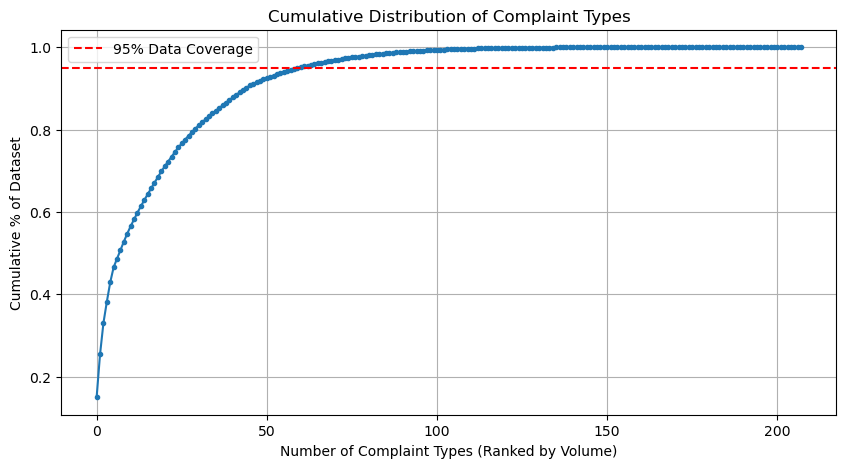

In [10]:
counts = df_merged['complaint_type'].value_counts()
total_rows = len(df_merged)

# 2. Define Thresholds to compare
thresh_1pct = total_rows * 0.01   # 1% (Your proposal)
thresh_01pct = total_rows * 0.002 # 0.1% (Standard alternative)

print(f"Total Rows: {total_rows:,}")
print(f"1% Threshold: {int(thresh_1pct):,} rows")
print(f"0.2% Threshold: {int(thresh_01pct):,} rows")

# 3. Identify what gets dropped
drop_1pct = counts[counts < thresh_1pct]
drop_01pct = counts[counts < thresh_01pct]

print(f"\n--- At 1% Threshold ({int(thresh_1pct):,} rows) ---")
print(f"You would drop {len(drop_1pct)} unique complaint types.")
print(f"Examples of dropped types: {drop_1pct.index[:5].tolist()}")
print(f"Total data lost: {drop_1pct.sum():,} rows ({(drop_1pct.sum()/total_rows)*100:.2f}%)")

print(f"\n--- At 0.2% Threshold ({int(thresh_01pct):,} rows) ---")
print(f"You would drop {len(drop_01pct)} unique complaint types.")
print(f"Total data lost: {drop_01pct.sum():,} rows ({(drop_01pct.sum()/total_rows)*100:.2f}%)")

# 4. Visual "Elbow" Plot
# We want to see where the curve flattens out
cumulative_percent = counts.cumsum() / total_rows
plt.figure(figsize=(10, 5))
plt.plot(range(len(counts)), cumulative_percent.values, marker='o', markersize=3)
plt.axhline(y=0.95, color='r', linestyle='--', label='95% Data Coverage')
plt.title('Cumulative Distribution of Complaint Types')
plt.xlabel('Number of Complaint Types (Ranked by Volume)')
plt.ylabel('Cumulative % of Dataset')
plt.legend()
plt.grid(True)
plt.show()

In [8]:
# 1. Define your Statistical Threshold (0.2%)
threshold_count = len(df_merged) * 0.002
counts = df_merged['complaint_type'].value_counts()

# 2. Identify the "High Volume" types
high_volume_types = counts[counts >= threshold_count].index.tolist()

# 3. Define your "Domain Knowledge" Whitelist
# These are features we MUST keep for the project, regardless of count.
# I included 'Damaged Tree' just in case it was also on the borderline.
whitelist = [
    'Snow Or Ice', 
    'Street Condition', 
    'Damaged Tree', 
    'Heat/Hot Water', 
    'Water Leak', 
    'Standing Water', 
    'Sewer'
]

# 4. Combine them (Union of the two sets)
# set() ensures we don't have duplicates
final_types_to_keep = list(set(high_volume_types + whitelist))

df_merged_reduced = df_merged[df_merged['complaint_type'].isin(final_types_to_keep)].copy()

print(f"Original Rows: {len(df_merged):,}")
print(f"Filtered Rows: {len(df_merged_reduced):,}")
print(f"Data Retained: {(len(df_merged_reduced)/len(df_merged))*100:.2f}%")
print(f"Unique Complaint Types: {df_merged_reduced['complaint_type'].nunique()}")

Original Rows: 6,502,814
Filtered Rows: 6,209,051
Data Retained: 95.48%
Unique Complaint Types: 64


In [11]:
df_merged_reduced = df_merged[df_merged.groupby('complaint_type').complaint_type.transform('count')>13005].copy() 

In [23]:
df_merged_reduced = df_merged_reduced.dropna()

## 0.3 Saving/Loading Existing data

Save datasets to save time on loading and cleaning data during future runs

In [95]:
df_311.to_csv("./urban-final-project/data/311_data.csv")

In [96]:
df_weather.to_csv("./urban-final-project/data/weather_data.csv")

In [7]:
df_merged.to_csv("./urban-final-project/data/merged_data.csv")

In [12]:
df_merged_reduced.to_csv("./urban-final-project/data/merged_reduced_data.csv")

In [ ]:
df_311 = pd.read_csv("./urban-final-project/data/311_data.csv", index_col=0)
df_weather = pd.read_csv("./urban-final-project/data/weather_data.csv", index_col=0)

In [6]:
df_merged =  pd.read_csv("./urban-final-project/data/merged_data.csv", index_col=0)

In [4]:
df_merged_reduced =  pd.read_csv("./urban-final-project/data/merged_reduced_data.csv", index_col=0)

In [ ]:
df_311.head()

In [ ]:
df_weather.head()

In [7]:
df_merged.head()

,unique_key,created_date,closed_date,complaint_type,descriptor,agency,latitude,longitude,borough,location_type,incident_zip,day,month,day_of_week,hour,time,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,56417527,2023-01-01 00:00:09,2023-01-01 00:36:06,Illegal Fireworks,n a,NYPD,40.640915,-73.973642,BROOKLYN,Street/Sidewalk,11218.0,2023-01-01,1,6,0,2023-01-01,10.9,5.3,12.0,0.4,0.0,NaN,9.9,NaN,1013.6,NaN
1,56416252,2023-01-01 00:00:42,2023-01-01 17:34:15,Noise - Residential,loud music party,NYPD,40.853848,-73.917709,BRONX,Residential Building/House,10453.0,2023-01-01,1,6,0,2023-01-01,10.9,5.3,12.0,0.4,0.0,NaN,9.9,NaN,1013.6,NaN
2,56418795,2023-01-01 00:00:45,2023-01-01 01:24:10,Illegal Parking,posted parking sign violation,NYPD,40.754875,-74.000747,MANHATTAN,Street/Sidewalk,10001.0,2023-01-01,1,6,0,2023-01-01,10.9,5.3,12.0,0.4,0.0,NaN,9.9,NaN,1013.6,NaN
3,56418136,2023-01-01 00:00:46,2023-01-01 01:01:43,Noise - Residential,loud music party,NYPD,40.620665,-73.926040,BROOKLYN,Residential Building/House,11234.0,2023-01-01,1,6,0,2023-01-01,10.9,5.3,12.0,0.4,0.0,NaN,9.9,NaN,1013.6,NaN
4,56413896,2023-01-01 00:00:57,2023-01-04 15:09:28,Street Condition,blocked construction,DOT,40.849297,-73.910479,BRONX,Street,10453.0,2023-01-01,1,6,0,2023-01-01,10.9,5.3,12.0,0.4,0.0,NaN,9.9,NaN,1013.6,NaN


In [14]:
df_merged_reduced.head()

,unique_key,created_date,closed_date,complaint_type,descriptor,agency,latitude,longitude,borough,location_type,incident_zip,day,month,day_of_week,hour,time,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,borough_encoded,location_type_encoded
0,56417527,2023-01-01 00:00:09,2023-01-01 00:36:06,Illegal Fireworks,n a,NYPD,40.640915,-73.973642,BROOKLYN,Street/Sidewalk,11218.0,2023-01-01,1,6,0,2023-01-01,10.9,5.3,12.0,0.4,0.0,NaN,9.9,NaN,1013.6,NaN,1,80
1,56416252,2023-01-01 00:00:42,2023-01-01 17:34:15,Noise - Residential,loud music party,NYPD,40.853848,-73.917709,BRONX,Residential Building/House,10453.0,2023-01-01,1,6,0,2023-01-01,10.9,5.3,12.0,0.4,0.0,NaN,9.9,NaN,1013.6,NaN,0,63
2,56418795,2023-01-01 00:00:45,2023-01-01 01:24:10,Illegal Parking,posted parking sign violation,NYPD,40.754875,-74.000747,MANHATTAN,Street/Sidewalk,10001.0,2023-01-01,1,6,0,2023-01-01,10.9,5.3,12.0,0.4,0.0,NaN,9.9,NaN,1013.6,NaN,2,80
3,56418136,2023-01-01 00:00:46,2023-01-01 01:01:43,Noise - Residential,loud music party,NYPD,40.620665,-73.926040,BROOKLYN,Residential Building/House,11234.0,2023-01-01,1,6,0,2023-01-01,10.9,5.3,12.0,0.4,0.0,NaN,9.9,NaN,1013.6,NaN,1,63
4,56413896,2023-01-01 00:00:57,2023-01-04 15:09:28,Street Condition,blocked construction,DOT,40.849297,-73.910479,BRONX,Street,10453.0,2023-01-01,1,6,0,2023-01-01,10.9,5.3,12.0,0.4,0.0,NaN,9.9,NaN,1013.6,NaN,0,77


# 1: Exploratory Data Analysis

In [97]:
df_311

,unique_key,created_date,closed_date,complaint_type,descriptor,agency,latitude,longitude,borough,location_type,incident_zip,day,month,day_of_week,hour
0,56417527,2023-01-01 00:00:09,2023-01-01 00:36:06,Illegal Fireworks,n a,NYPD,40.640914779776715,-73.97364216306418,BROOKLYN,Street/Sidewalk,11218,2023-01-01,1,6,0
1,56416252,2023-01-01 00:00:42,2023-01-01 17:34:15,Noise - Residential,loud music party,NYPD,40.85384789145288,-73.91770920479841,BRONX,Residential Building/House,10453,2023-01-01,1,6,0
2,56418795,2023-01-01 00:00:45,2023-01-01 01:24:10,Illegal Parking,posted parking sign violation,NYPD,40.75487501846257,-74.00074715055744,MANHATTAN,Street/Sidewalk,10001,2023-01-01,1,6,0
3,56418136,2023-01-01 00:00:46,2023-01-01 01:01:43,Noise - Residential,loud music party,NYPD,40.62066491675458,-73.92604033064251,BROOKLYN,Residential Building/House,11234,2023-01-01,1,6,0
4,56413896,2023-01-01 00:00:57,2023-01-04 15:09:28,Street Condition,blocked construction,DOT,40.8492972760343,-73.91047850877979,BRONX,Street,10453,2023-01-01,1,6,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6683869,63580924,2024-12-31 23:59:21,2025-01-01 00:42:47,Noise - Residential,loud music party,NYPD,40.6347449187686,-73.96493632865035,BROOKLYN,Residential Building/House,11230,2024-12-31,12,1,23
6683870,63574822,2024-12-31 23:59:31,2025-01-01 09:01:36,Noise - Residential,loud music party,NYPD,40.89187241649303,-73.86016845296459,BRONX,Residential Building/House,10466,2024-12-31,12,1,23
6683871,63581093,2024-12-31 23:59:32,2025-01-01 00:18:51,Noise - Residential,loud music party,NYPD,40.688334599490894,-73.93014442097454,BROOKLYN,Residential Building/House,11221,2024-12-31,12,1,23
6683872,63574642,2024-12-31 23:59:33,2025-01-02 17:08:17,Noise - Residential,loud music party,NYPD,40.89187241649303,-73.86016845296459,BRONX,Residential Building/House,10466,2024-12-31,12,1,23


In [55]:
df_311.groupby("complaint_type").count()

,unique_key,created_date,closed_date,descriptor,agency,latitude,longitude,borough,day,month,day_of_week,hour
complaint_type,,,,,,,,,,,,
Abandoned Bike,2605,2605,2605,2605,2605,2605,2605,2605,2605,2605,2605,2605
Abandoned Vehicle,81208,81208,81208,81208,81208,81208,81208,81208,81208,81208,81208,81208
Adopt-A-Basket,169,169,140,169,169,169,169,169,169,169,169,169
Ahv Inspection Unit,143,143,143,143,143,143,143,143,143,143,143,143
Air Quality,14051,14051,14050,14051,14051,14051,14051,14051,14051,14051,14051,14051
...,...,...,...,...,...,...,...,...,...,...,...,...
Water System,63106,63106,62484,63106,63106,63106,63106,63106,63106,63106,63106,63106
Window Guard,17,17,17,17,17,17,17,17,17,17,17,17
Wood Pile Remaining,674,674,587,674,674,674,674,674,674,674,674,674


In [110]:
top_borough = df_311['borough'].value_counts()

# print("Top 20 Complaint Types by Volume:")
print(top_borough)

borough
BROOKLYN         2007687
QUEENS           1558394
BRONX            1349005
MANHATTAN        1342094
STATEN ISLAND     242696
Unspecified         2938
Name: count, dtype: int64


In [112]:
top_complaints = df_311['complaint_type'].value_counts().head(20)

print("Top 20 Complaint Types by Volume:")
print(top_complaints)

Top 20 Complaint Types by Volume:
complaint_type
Illegal Parking            976325
Noise - Residential        676005
Heat/Hot Water             496025
Blocked Driveway           336007
Noise - Street/Sidewalk    307468
Unsanitary Condition       237573
Noise - Commercial         135759
Plumbing                   135158
Abandoned Vehicle          133738
Paint/Plaster              125805
Water System               117590
Dirty Condition            107770
Noise - Unspecified        106761
Noise - Vehicle             98677
Street Condition            98472
Door/Window                 91866
Derelict Vehicles           91689
Water Leak                  91385
Missed Collection           88827
Noise - Helicopter          87808
Name: count, dtype: int64


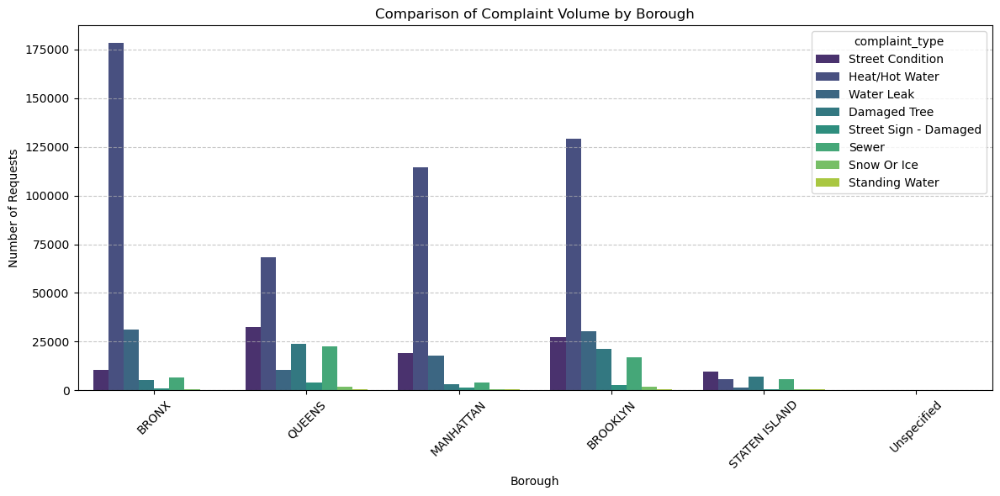

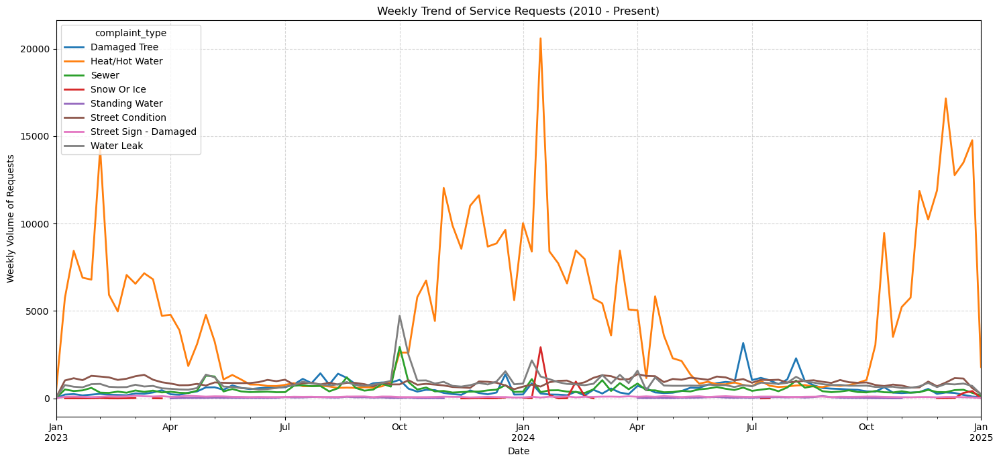

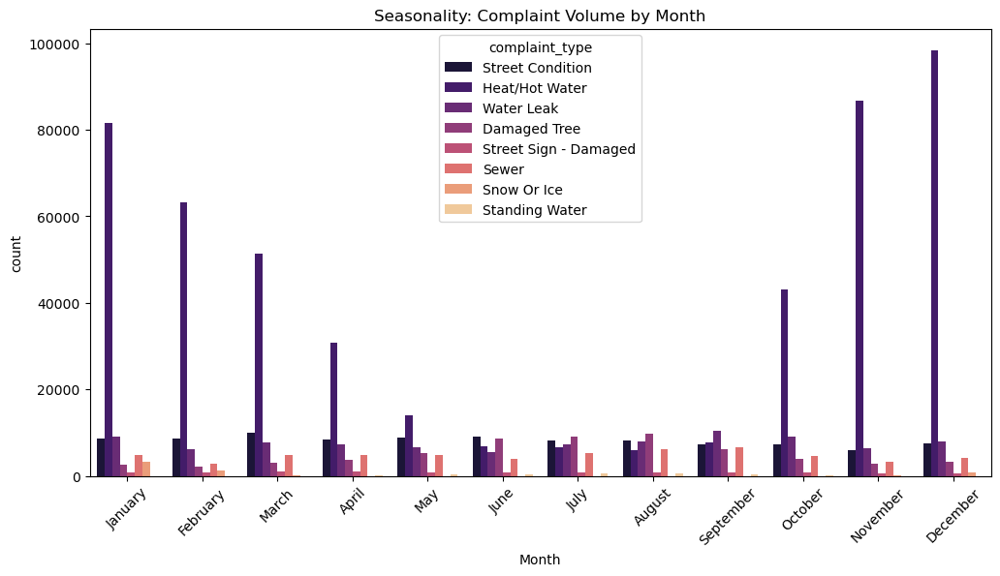

In [ ]:
import seaborn as sns

# --- Step 1: Filter Data for Targets ---
# We focus on the two high-value targets identified
targets = ['Snow Or Ice', 'Street Condition', 'Damaged Tree', 'Heat/Hot Water', 'Water Leak', 'Standing Water', 'Sewer']
df_analysis = df_311[df_311['complaint_type'].isin(targets)].copy()

# --- Step 2: Comparative Analysis by Borough ---
# We normalize by log scale if the disparity is huge, but raw counts are good for now.
plt.figure(figsize=(12, 6))
sns.countplot(
    data=df_analysis,
    x='borough',
    hue='complaint_type',
    palette='viridis'
)
plt.title('Comparison of Complaint Volume by Borough')
plt.ylabel('Number of Requests')
plt.xlabel('Borough')
plt.xticks(rotation=45)
plt.legend(title='complaint_type')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# --- Step 3: Incident Type Over Time (Time Series) ---
# Resample by Week ('W') to smooth out daily noise but keep granular trends
# We pivot the data to get columns for each complaint_type
df_time = df_analysis.set_index('created_date')
df_resampled = df_time.groupby([pd.Grouper(freq='W'), 'complaint_type']).size().unstack()

# Plotting
plt.figure(figsize=(15, 7))
df_resampled.plot(ax=plt.gca(), linewidth=2)

plt.title('Weekly Trend of Service Requests (2023 - 2024)')
plt.ylabel('Weekly Volume of Requests')
plt.xlabel('Date')
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(title='complaint_type')
plt.tight_layout()
plt.show()

# --- Step 4: Seasonality Check (Month of Year) ---
# This is critical for your "Weather" hypothesis.
# We expect Potholes to spike in Spring (March/April) due to freeze-thaw.
df_analysis['Month'] = df_analysis['created_date'].dt.month_name()
# Order for plotting
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 
               'July', 'August', 'September', 'October', 'November', 'December']

plt.figure(figsize=(12, 6))
sns.countplot(
    data=df_analysis, 
    x='Month', 
    hue='complaint_type', 
    order=month_order,
    palette='magma'
)
plt.title('Seasonality: Complaint Volume by Month')
plt.xticks(rotation=45)
plt.show()

In [105]:
df_analysis

,unique_key,created_date,closed_date,complaint_type,descriptor,agency,latitude,longitude,borough,location_type,incident_zip,day,month,day_of_week,hour,Month
2,56418795,2023-01-01 00:00:45,2023-01-01 01:24:10,Illegal Parking,posted parking sign violation,NYPD,40.75487501846257,-74.00074715055744,MANHATTAN,Street/Sidewalk,10001,2023-01-01,1,6,0,January
4,56413896,2023-01-01 00:00:57,2023-01-04 15:09:28,Street Condition,blocked construction,DOT,40.8492972760343,-73.91047850877979,BRONX,Street,10453,2023-01-01,1,6,0,January
10,56418251,2023-01-01 00:01:50,2023-01-01 02:31:47,Illegal Parking,blocked crosswalk,NYPD,40.61789437610167,-73.95613825034788,BROOKLYN,Street/Sidewalk,11230,2023-01-01,1,6,0,January
19,56416806,2023-01-01 00:03:42,2023-01-01 03:02:12,Illegal Parking,blocked hydrant,NYPD,40.71481064814987,-73.91037416673439,QUEENS,Street/Sidewalk,11378,2023-01-01,1,6,0,January
34,56414264,2023-01-01 00:06:11,2023-01-01 03:30:43,Illegal Parking,blocked hydrant,NYPD,40.7244711757953,-73.90564941620535,QUEENS,Street/Sidewalk,11378,2023-01-01,1,6,0,January
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6683826,63576867,2024-12-31 23:54:32,2025-01-01 00:52:29,Illegal Parking,posted parking sign violation,NYPD,40.6117039475733,-73.97045180115299,BROOKLYN,Street/Sidewalk,11230,2024-12-31,12,1,23,December
6683827,63579944,2024-12-31 23:54:52,2025-01-01 01:59:48,Illegal Parking,blocked hydrant,NYPD,40.61053238372868,-74.01164403325879,BROOKLYN,Street/Sidewalk,11228,2024-12-31,12,1,23,December
6683839,63585372,2024-12-31 23:56:19,2025-01-01 01:43:43,Illegal Parking,blocked sidewalk,NYPD,40.70580375999308,-73.89884822508763,QUEENS,Street/Sidewalk,11385,2024-12-31,12,1,23,December
6683850,63580250,2024-12-31 23:57:07,2025-01-01 01:00:32,Illegal Parking,posted parking sign violation,NYPD,40.5510274588818,-74.17991349162548,STATEN ISLAND,Street/Sidewalk,10312,2024-12-31,12,1,23,December


In [15]:
df_weather

,time,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun
0,2023-01-01,10.9,5.3,12.0,0.4,0.0,NaN,9.9,NaN,1013.6,NaN
1,2023-01-02,11.4,9.0,13.0,0.5,0.0,NaN,7.2,NaN,1020.2,NaN
2,2023-01-03,11.1,8.0,14.0,9.6,0.0,NaN,8.5,NaN,1014.9,NaN
3,2023-01-04,14.4,9.0,19.0,9.9,0.0,NaN,8.8,NaN,1010.9,NaN
4,2023-01-05,8.6,7.0,10.0,0.4,0.0,NaN,8.5,NaN,1014.7,NaN
...,...,...,...,...,...,...,...,...,...,...,...
726,2024-12-27,1.5,-9.1,6.0,0.0,0.0,NaN,5.1,NaN,1030.8,NaN
727,2024-12-28,7.6,4.0,11.0,2.5,0.0,NaN,5.3,NaN,1025.3,NaN
728,2024-12-29,13.0,11.0,20.0,2.5,0.0,NaN,9.7,NaN,1017.8,NaN
729,2024-12-30,11.7,9.0,14.0,11.1,0.0,NaN,13.4,NaN,1005.9,NaN


In [5]:
import osmnx as ox
import geopandas as gpd
import shapely.geometry

In [6]:
df_brooklyn = df_311[df_311['borough'] == "BROOKLYN"].copy()

place_name = "Brooklyn, New York City, New York, USA"

In [127]:
df_brooklyn

,unique_key,created_date,closed_date,complaint_type,descriptor,agency,latitude,longitude,borough,location_type,incident_zip,day,month,day_of_week,hour
0,56417527,2023-01-01 00:00:09,2023-01-01 00:36:06,Illegal Fireworks,n a,NYPD,40.640914779776715,-73.97364216306418,BROOKLYN,Street/Sidewalk,11218,2023-01-01,1,6,0
3,56418136,2023-01-01 00:00:46,2023-01-01 01:01:43,Noise - Residential,loud music party,NYPD,40.62066491675458,-73.92604033064251,BROOKLYN,Residential Building/House,11234,2023-01-01,1,6,0
10,56418251,2023-01-01 00:01:50,2023-01-01 02:31:47,Illegal Parking,blocked crosswalk,NYPD,40.61789437610167,-73.95613825034788,BROOKLYN,Street/Sidewalk,11230,2023-01-01,1,6,0
12,56413435,2023-01-01 00:01:54,2023-01-01 00:43:40,Noise - Street/Sidewalk,loud talking,NYPD,40.63968638126339,-73.97990859982983,BROOKLYN,Street/Sidewalk,11218,2023-01-01,1,6,0
14,56415422,2023-01-01 00:02:00,2023-01-05 09:04:00,Water System,no water wnw,DEP,40.642231191339015,-73.94672476753257,BROOKLYN,NaN,11226,2023-01-01,1,6,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6683861,63572345,2024-12-31 23:58:21,2025-01-01 00:06:15,Noise - House Of Worship,loud music party,NYPD,40.677589846078284,-73.91914887353346,BROOKLYN,House of Worship,11233,2024-12-31,12,1,23
6683863,63575575,2024-12-31 23:58:34,2025-01-01 00:05:49,Noise - Residential,banging pounding,NYPD,40.71120965026345,-73.95897331500413,BROOKLYN,Residential Building/House,11211,2024-12-31,12,1,23
6683869,63580924,2024-12-31 23:59:21,2025-01-01 00:42:47,Noise - Residential,loud music party,NYPD,40.6347449187686,-73.96493632865035,BROOKLYN,Residential Building/House,11230,2024-12-31,12,1,23
6683871,63581093,2024-12-31 23:59:32,2025-01-01 00:18:51,Noise - Residential,loud music party,NYPD,40.688334599490894,-73.93014442097454,BROOKLYN,Residential Building/House,11221,2024-12-31,12,1,23


In [7]:
try:
    # Simplify=True cleans up complex intersections which helps with analysis
    G = ox.graph_from_place(place_name, network_type='drive', simplify=True)
    print("✅ Graph downloaded successfully!")
except Exception as e:
    print(f"❌ Error downloading graph: {e}")
    # Fallback for complex names (sometimes 'Brooklyn' needs 'Kings County')
    print("Try hardcoding specific place names if this fails.")

G_brooklyn = ox.project_graph(G)

✅ Graph downloaded successfully!


In [47]:
G_queens = ox.project_graph(G)

In [48]:
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)

print(f"Graph Stats:")
print(f" - Nodes (Intersections): {len(gdf_nodes)}")
print(f" - Edges (Street Segments): {len(gdf_edges)}")

# Quick Plot to verify topology
# fig, ax = plt.subplots(figsize=(10, 10))
# gdf_edges.plot(ax=ax, linewidth=0.5, color='gray', alpha=0.7)
# ax.set_title(f'Street Network: Brooklyn (Drive)', fontsize=15)
# ax.set_axis_off()
# plt.show()

Graph Stats:
 - Nodes (Intersections): 21524
 - Edges (Street Segments): 56051


In [49]:
geometry = [shapely.geometry.Point(x, y) for x, y in zip(df_merged_reduced_queens['longitude'], df_merged_reduced_queens['latitude'])]

# 2. Create the GeoDataFrame
gdf_complaints = gpd.GeoDataFrame(df_merged_reduced_queens, geometry=geometry, crs="EPSG:4326")

In [51]:
gdf_complaints_proj = gdf_complaints.to_crs(G.graph['crs'])

In [52]:
nearest_edges = ox.nearest_edges(
    G, 
    gdf_complaints_proj.geometry.x, 
    gdf_complaints_proj.geometry.y
)

gdf_complaints_proj['nearest_edge'] = nearest_edges

In [55]:
gdf_complaints_proj

,unique_key,created_date,closed_date,complaint_type,descriptor,agency,latitude,longitude,borough,location_type,incident_zip,day,month,day_of_week,hour,time,tavg,tmin,tmax,prcp,snow,wdir,wspd,wpgt,pres,tsun,borough_encoded,location_type_encoded,nearest_node,geometry,nearest_edge
5,56415045,2023-01-01 00:01:16,2023-01-04 22:22:09,Heat/Hot Water,entire building,HPD,40.756880,-73.872901,QUEENS,RESIDENTIAL BUILDING,11372.0,2023-01-01,1,6,0,2023-01-01,10.9,5.3,12.0,0.4,0.0,NaN,9.9,NaN,1013.6,NaN,3,59,7762094053,POINT (-73.8729 40.75688),"(7762094065, 7762094053, 0)"
7,56418977,2023-01-01 00:01:38,2023-01-01 03:24:32,Noise - Residential,loud music party,NYPD,40.710379,-73.752158,QUEENS,Residential Building/House,11429.0,2023-01-01,1,6,0,2023-01-01,10.9,5.3,12.0,0.4,0.0,NaN,9.9,NaN,1013.6,NaN,3,63,5777684458,POINT (-73.75216 40.71038),"(42835149, 5777684458, 0)"
8,56418372,2023-01-01 00:01:39,2023-01-01 00:58:18,Blocked Driveway,partial access,NYPD,40.709790,-73.910060,QUEENS,Street/Sidewalk,11385.0,2023-01-01,1,6,0,2023-01-01,10.9,5.3,12.0,0.4,0.0,NaN,9.9,NaN,1013.6,NaN,3,80,42806573,POINT (-73.91006 40.70979),"(42806573, 42851912, 0)"
13,56412730,2023-01-01 00:01:57,2023-01-01 00:49:42,Noise - Commercial,loud music party,NYPD,40.727633,-73.892487,QUEENS,Store/Commercial,11378.0,2023-01-01,1,6,0,2023-01-01,10.9,5.3,12.0,0.4,0.0,NaN,9.9,NaN,1013.6,NaN,3,76,42871360,POINT (-73.89249 40.72763),"(42871360, 42871355, 0)"
19,56416806,2023-01-01 00:03:42,2023-01-01 03:02:12,Illegal Parking,blocked hydrant,NYPD,40.714811,-73.910374,QUEENS,Street/Sidewalk,11378.0,2023-01-01,1,6,0,2023-01-01,10.9,5.3,12.0,0.4,0.0,NaN,9.9,NaN,1013.6,NaN,3,80,42847277,POINT (-73.91037 40.71481),"(42881219, 42847277, 0)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6502781,63572220,2024-12-31 23:56:26,2025-01-01 01:51:27,Blocked Driveway,partial access,NYPD,40.735364,-73.858541,QUEENS,Street/Sidewalk,11374.0,2024-12-31,12,1,23,2024-12-31,8.9,7.0,11.0,11.2,0.0,NaN,8.6,NaN,1010.2,NaN,3,80,3324555220,POINT (-73.85854 40.73536),"(3324555220, 42819268, 0)"
6502785,63580712,2024-12-31 23:56:49,2025-01-01 00:56:20,Illegal Fireworks,n a,NYPD,40.752389,-73.776957,QUEENS,Residential Building/House,11364.0,2024-12-31,12,1,23,2024-12-31,8.9,7.0,11.0,11.2,0.0,NaN,8.6,NaN,1010.2,NaN,3,63,42880459,POINT (-73.77696 40.75239),"(42910300, 42880459, 0)"
6502794,63573436,2024-12-31 23:57:20,2025-01-01 00:15:45,Illegal Parking,blocked hydrant,NYPD,40.759676,-73.909592,QUEENS,Street/Sidewalk,11103.0,2024-12-31,12,1,23,2024-12-31,8.9,7.0,11.0,11.2,0.0,NaN,8.6,NaN,1010.2,NaN,3,80,42810512,POINT (-73.90959 40.75968),"(42860063, 2402842567, 0)"
6502806,63578152,2024-12-31 23:58:49,2025-01-01 02:07:20,Noise - Residential,banging pounding,NYPD,40.680320,-73.842008,QUEENS,Residential Building/House,11417.0,2024-12-31,12,1,23,2024-12-31,8.9,7.0,11.0,11.2,0.0,NaN,8.6,NaN,1010.2,NaN,3,63,42814345,POINT (-73.84201 40.68032),"(42814345, 5488564954, 0)"


In [12]:
edge_counts = gdf_complaints_proj['nearest_edge'].value_counts()

# Initialize a new attribute 'complaint_count' on all edges to 0
for u, v, k, data in G_brooklyn.edges(keys=True, data=True):
    data['complaint_count'] = 0

# Update the graph with the actual counts
# We iterate through our counts and update the graph attributes
max_complaints = 0
for edge, count in edge_counts.items():
    u, v, k = edge
    # Check if edge exists in graph (safety check)
    if G_brooklyn.has_edge(u, v, key=k):
        G_brooklyn[u][v][k]['complaint_count'] = count
        if count > max_complaints:
            max_complaints = count

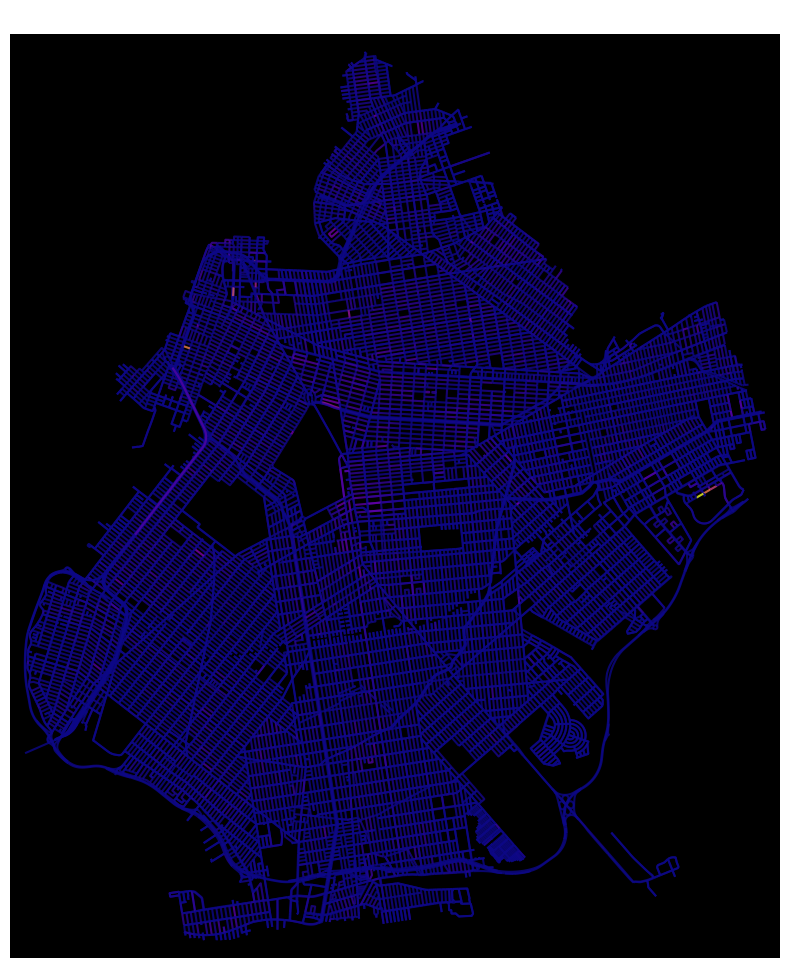

In [13]:

# 1. Get colors using 'plasma' (Sequential: Purple -> Pink -> Yellow)
#    We use a darker gray for 'na_color' so zero-complaint streets fade into the background
ec = ox.plot.get_edge_colors_by_attr(
    G_brooklyn, 
    attr='complaint_count', 
    cmap='plasma',       # Brighter sequential map
    na_color='#222222'   # Dark grey for edges with 0 complaints (blends with black bg)
)

# 2. Plot graph with dark background for contrast
fig, ax = ox.plot_graph(
    G_brooklyn, 
    node_size=0, 
    edge_color=ec, 
    edge_linewidth=1.5, 
    edge_alpha=0.8,      # Increased alpha slightly for visibility
    bgcolor='k',         # Black background makes 'plasma' colors glow
    figsize=(12, 12),
    show=False
)

ax.set_title("Heatmap of Service Requests (Brooklyn)", color='w', fontsize=15)
plt.show()

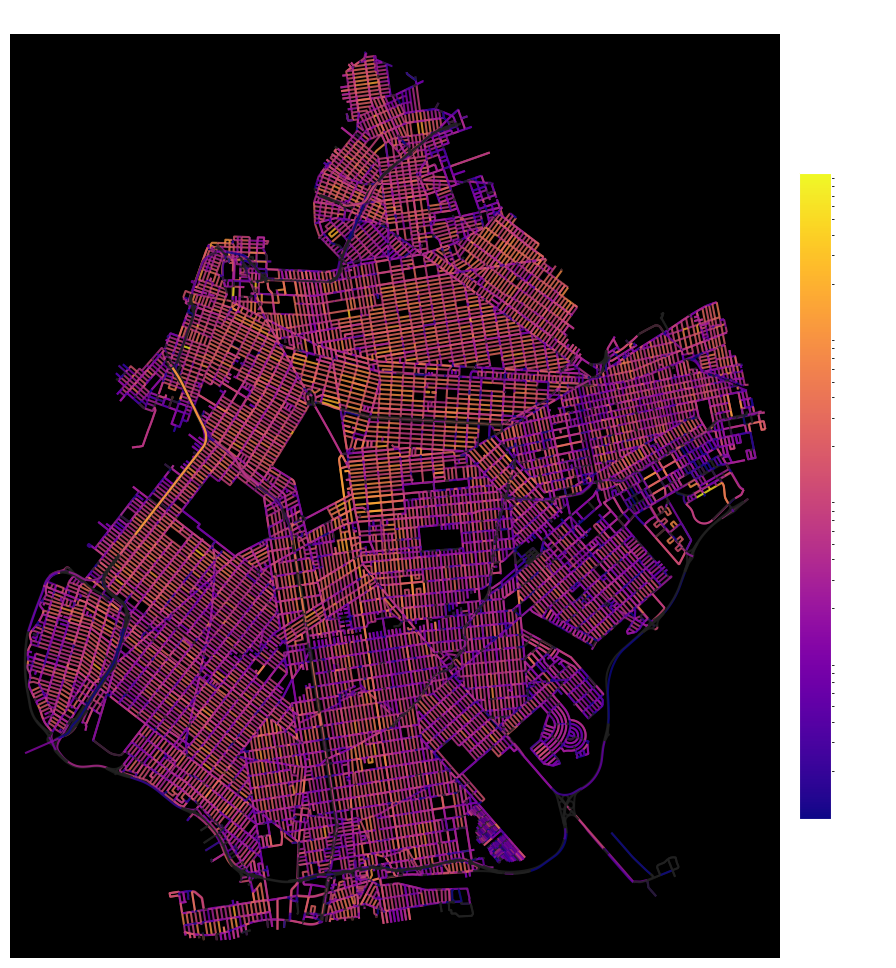

In [ ]:

# --- Step 1: Prepare Data ---
edge_values = [data['complaint_count'] for u, v, k, data in G_brooklyn.edges(keys=True, data=True)]

# Set Scale
vmax = max(edge_values)
vmin = 1 

# --- Step 2: Create Logarithmic Color Mapper ---
norm = colors.LogNorm(vmin=vmin, vmax=vmax)
cmap = plt.get_cmap('plasma')
sm = cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])

# --- Step 3: Generate Uniform Edge Colors (The Fix) ---
# We convert the grey string to a tuple so the entire list is (R, G, B, A) tuples
grey_rgba = colors.to_rgba('#222222') 

ec = [sm.to_rgba(count) if count > 0 else grey_rgba for count in edge_values]

# --- Step 4: Plot ---
fig, ax = ox.plot_graph(
    G_brooklyn, 
    node_size=0, 
    edge_color=ec, 
    edge_linewidth=1.5, 
    edge_alpha=0.8,
    bgcolor='k', 
    figsize=(12, 12),
    show=False
)

# --- Step 5: Add Legend ---
cb = fig.colorbar(sm, ax=ax, shrink=0.7, pad=0.02)
cb.set_label('Number of Service Requests (Log Scale)', color='white', fontsize=12)
cb.ax.yaxis.set_tick_params(color='white', labelcolor='white') 
cb.outline.set_edgecolor('white')

ax.set_title("Log-Scaled Heatmap of Service Requests (Brooklyn)", color='w', fontsize=15)
plt.show()

In [45]:
def generate_borough(data, borough_name, G=None):
  df = data[data['borough'] == borough_name.upper()].copy()
  place_name = f"{borough_name.title()}, New York City, New York, USA"

  if not G:
    try:
      # Simplify=True cleans up complex intersections which helps with analysis
      G = ox.graph_from_place(place_name, network_type='drive', simplify=True)
      print("✅ Graph downloaded successfully!")
    except Exception as e:
      print(f"❌ Error downloading graph: {e}")
      # Fallback for complex names (sometimes 'Brooklyn' needs 'Kings County')
      print("Try hardcoding specific place names if this fails.")

  G_borough = ox.project_graph(G)

  gdf_nodes, gdf_edges = ox.graph_to_gdfs(G_borough)

  # print(f"Graph Stats:")
  # print(f" - Nodes (Intersections): {len(gdf_nodes)}")
  # print(f" - Edges (Street Segments): {len(gdf_edges)}")

  geometry = [shapely.geometry.Point(x, y) for x, y in zip(df['longitude'], df['latitude'])]

  # 2. Create the GeoDataFrame
  gdf_complaints = gpd.GeoDataFrame(df, geometry=geometry, crs="EPSG:4326")

  gdf_complaints_proj = gdf_complaints.to_crs(G_borough.graph['crs'])

  nearest_edges = ox.nearest_edges(
    G_borough, 
    gdf_complaints_proj.geometry.x, 
    gdf_complaints_proj.geometry.y
  )

  gdf_complaints_proj['nearest_edge'] = nearest_edges

  edge_counts = gdf_complaints_proj['nearest_edge'].value_counts()

  # Initialize a new attribute 'complaint_count' on all edges to 0
  for u, v, k, data in G_borough.edges(keys=True, data=True):
      data['complaint_count'] = 0

  # Update the graph with the actual counts
  # We iterate through our counts and update the graph attributes
  max_complaints = 0
  for edge, count in edge_counts.items():
      u, v, k = edge
      # Check if edge exists in graph (safety check)
      if G_borough.has_edge(u, v, key=k):
          G_borough[u][v][k]['complaint_count'] = count
          if count > max_complaints:
              max_complaints = count

  return (G_borough, G)

In [46]:
def plot_borough(G, borough_name, title=None, log=True):
  if not log:
    ec = ox.plot.get_edge_colors_by_attr(
      G, 
      attr='complaint_count', 
      cmap='plasma',       # Brighter sequential map
      na_color='#222222'   # Dark grey for edges with 0 complaints (blends with black bg)
    )

    # 2. Plot graph with dark background for contrast
    fig, ax = ox.plot_graph(
        G, 
        node_size=0, 
        edge_color=ec, 
        edge_linewidth=1.5, 
        edge_alpha=0.8,      # Increased alpha slightly for visibility
        bgcolor='k',         # Black background makes 'plasma' colors glow
        figsize=(12, 12),
        show=False
    )

    if title:
      ax.set_title(title, color='w', fontsize=15)
    else:
      ax.set_title(f"Heatmap of Service Requests ({borough_name.title()})", color='w', fontsize=15)
    plt.show()
  else:
    # --- Step 1: Prepare Data ---
    edge_values = [data['complaint_count'] for u, v, k, data in G.edges(keys=True, data=True)]

    # Set Scale
    vmax = max(edge_values)
    vmin = 1 

    # --- Step 2: Create Logarithmic Color Mapper ---
    norm = colors.LogNorm(vmin=vmin, vmax=vmax)
    cmap = plt.get_cmap('plasma')
    sm = cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])

    # --- Step 3: Generate Uniform Edge Colors (The Fix) ---
    # We convert the grey string to a tuple so the entire list is (R, G, B, A) tuples
    grey_rgba = colors.to_rgba('#222222') 

    ec = [sm.to_rgba(count) if count > 0 else grey_rgba for count in edge_values]

    # --- Step 4: Plot ---
    fig, ax = ox.plot_graph(
        G, 
        node_size=0, 
        edge_color=ec, 
        edge_linewidth=1.5, 
        edge_alpha=0.8,
        bgcolor='k', 
        figsize=(12, 12),
        show=False
    )

    # --- Step 5: Add Legend ---
    cb = fig.colorbar(sm, ax=ax, shrink=0.7, pad=0.02)
    cb.set_label('Number of Service Requests (Log Scale)', color='white', fontsize=12)
    cb.ax.yaxis.set_tick_params(color='white', labelcolor='white') 
    cb.outline.set_edgecolor('white')

    if title:
      ax.set_title(title, color='w', fontsize=15)
    else:
      ax.set_title(f"Log-Scaled Heatmap of Service Requests ({borough_name.title()})", color='w', fontsize=15)
    plt.show()

✅ Graph downloaded successfully!
Graph Stats:
 - Nodes (Intersections): 21524
 - Edges (Street Segments): 56051


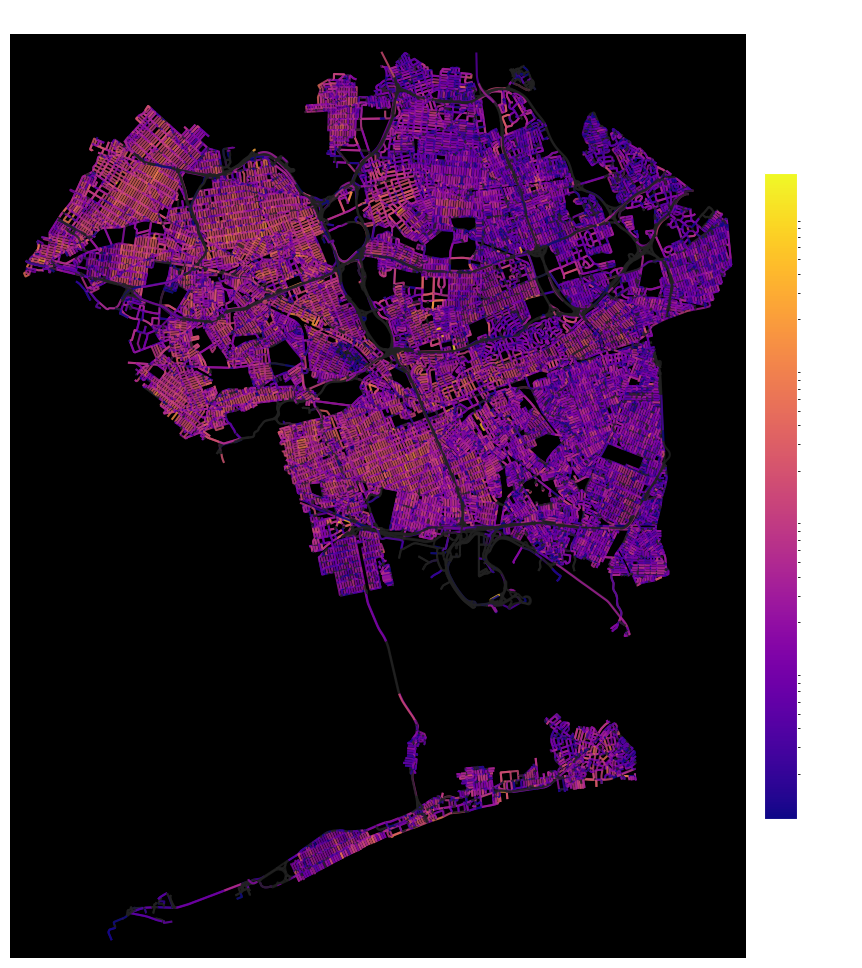

In [ ]:
borough_name = "Queens"
G_queens = generate_borough(df_311, borough_name)
plot_borough(G_queens, borough_name)

✅ Graph downloaded successfully!


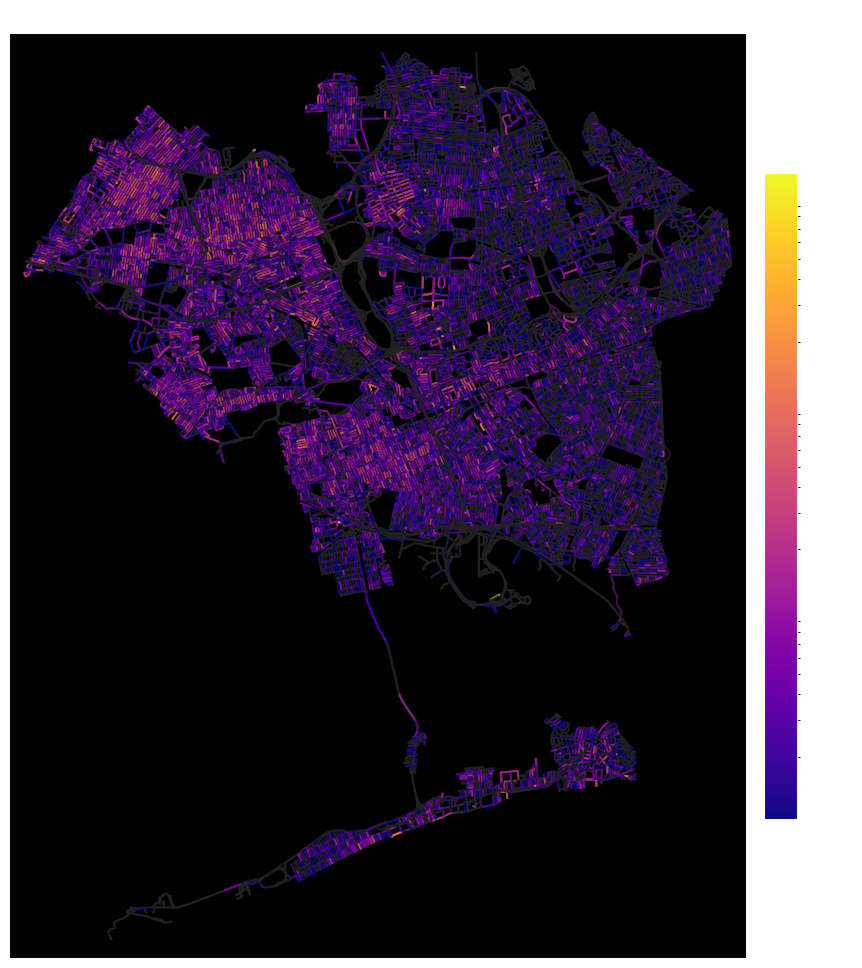

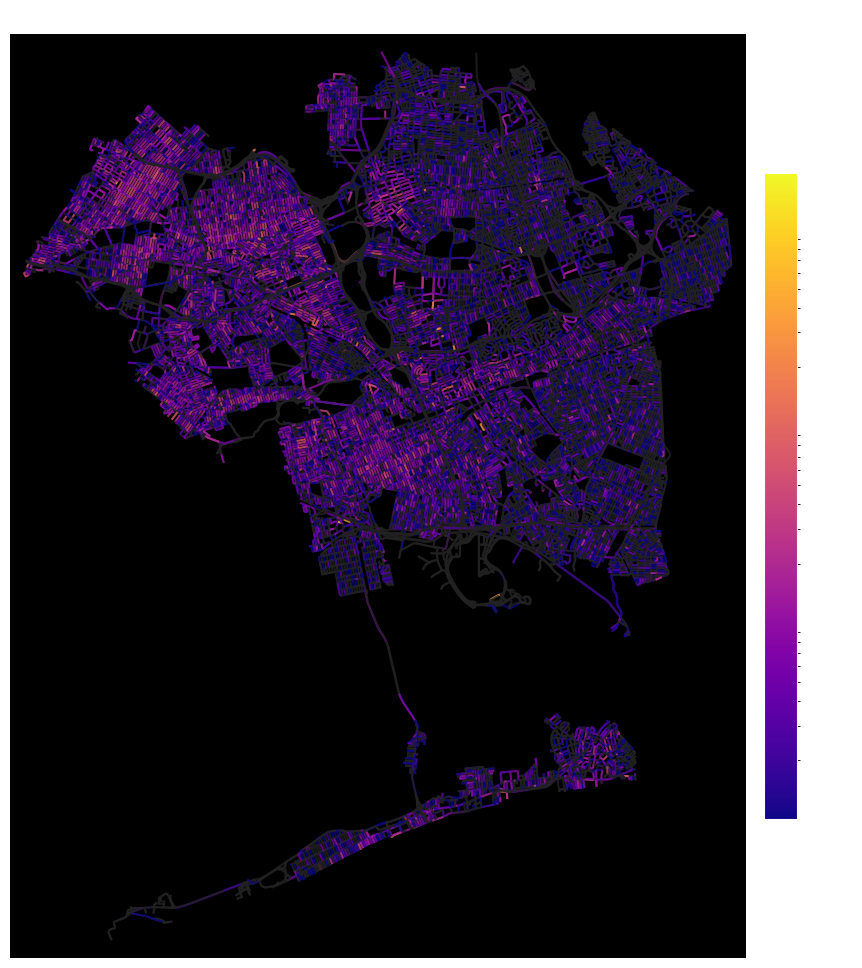

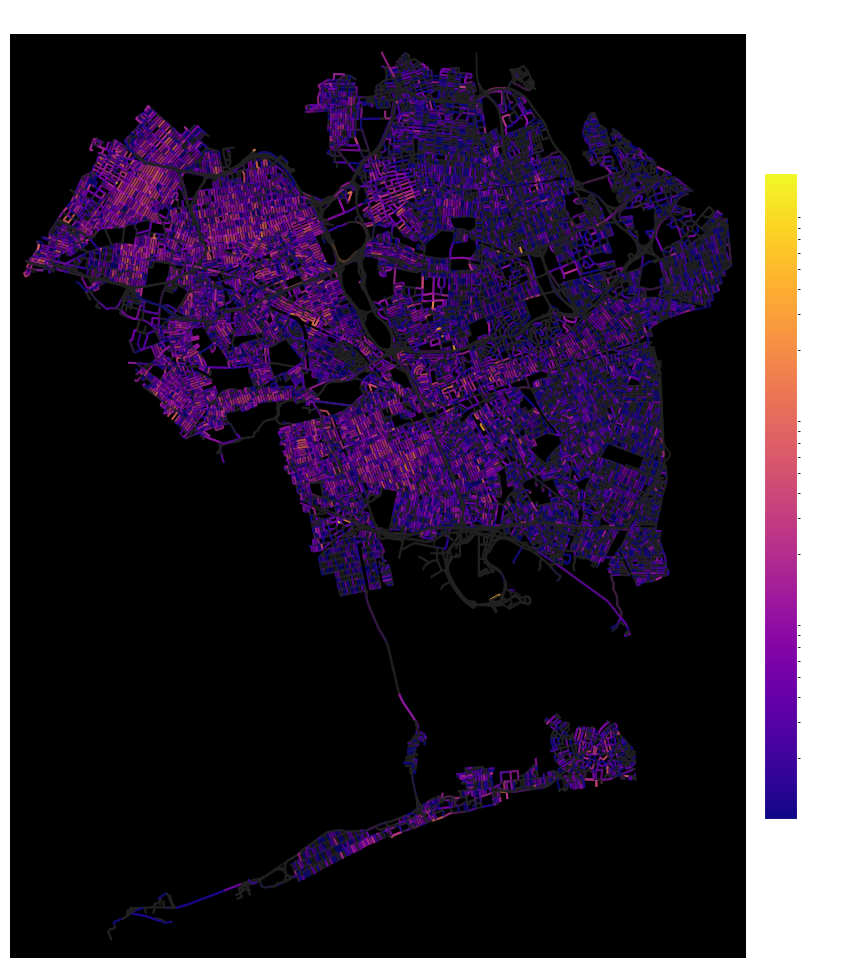

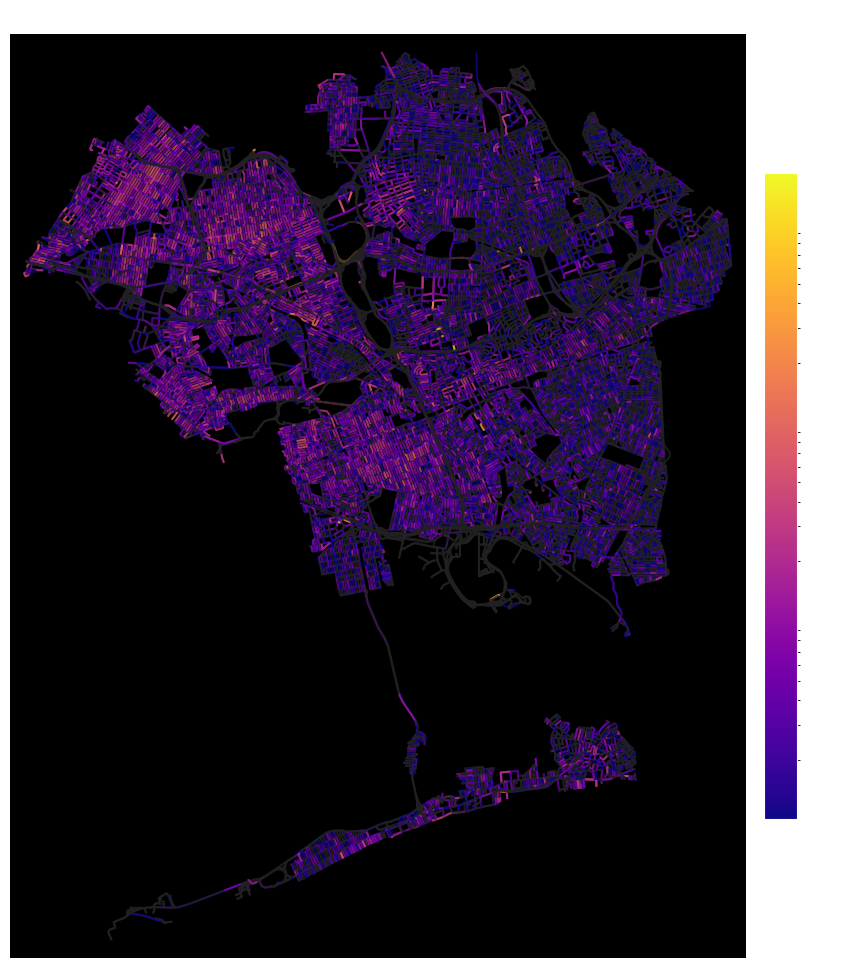

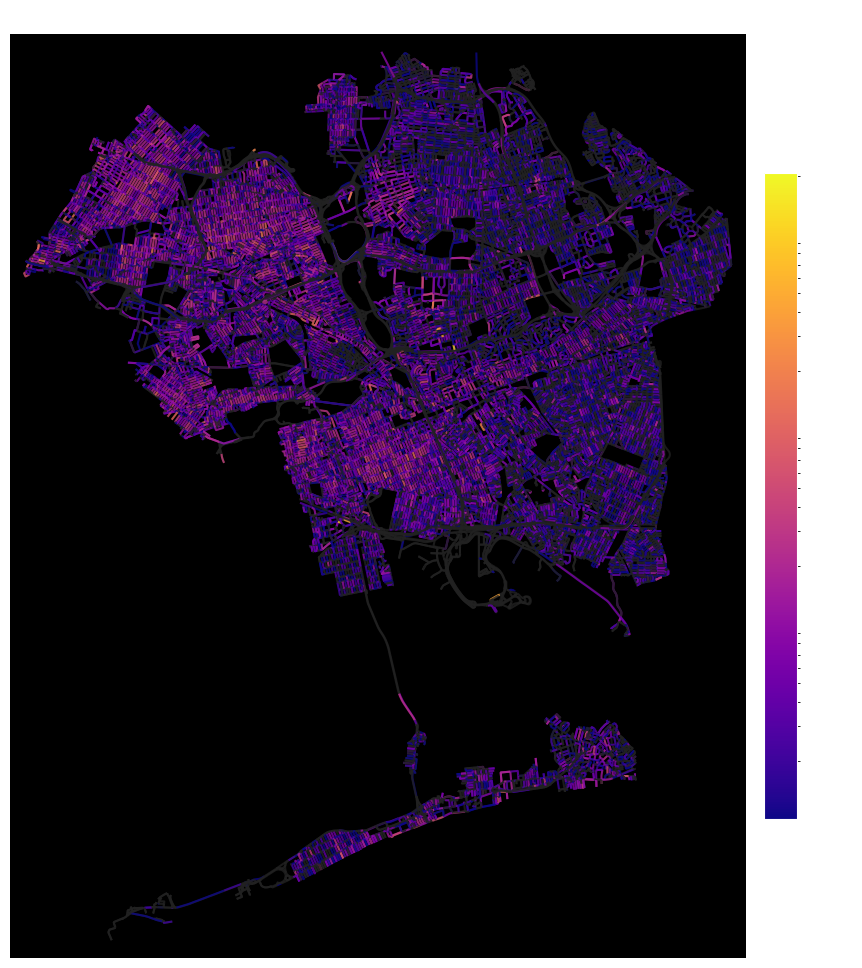

...

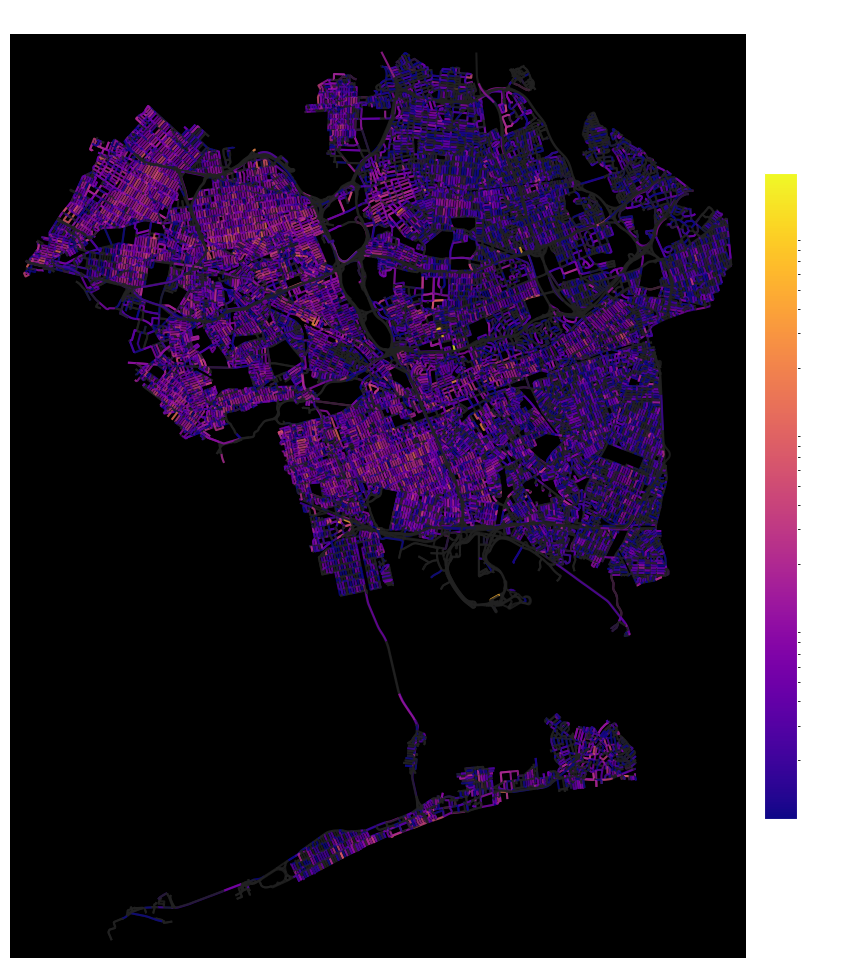

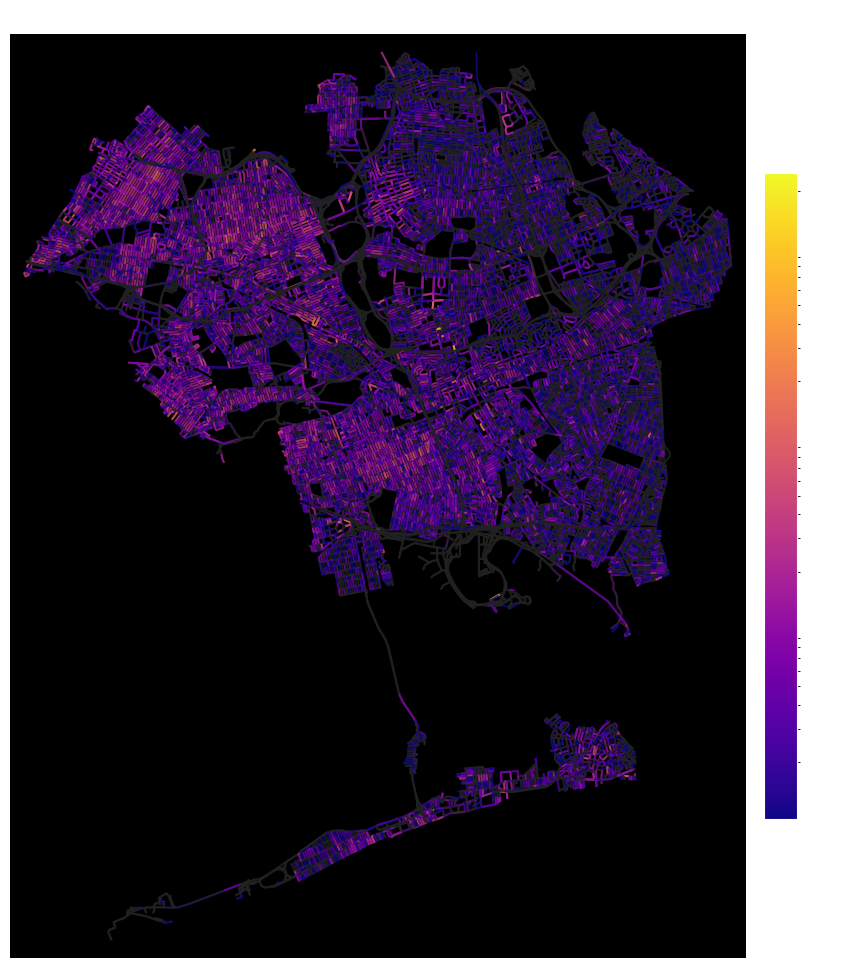

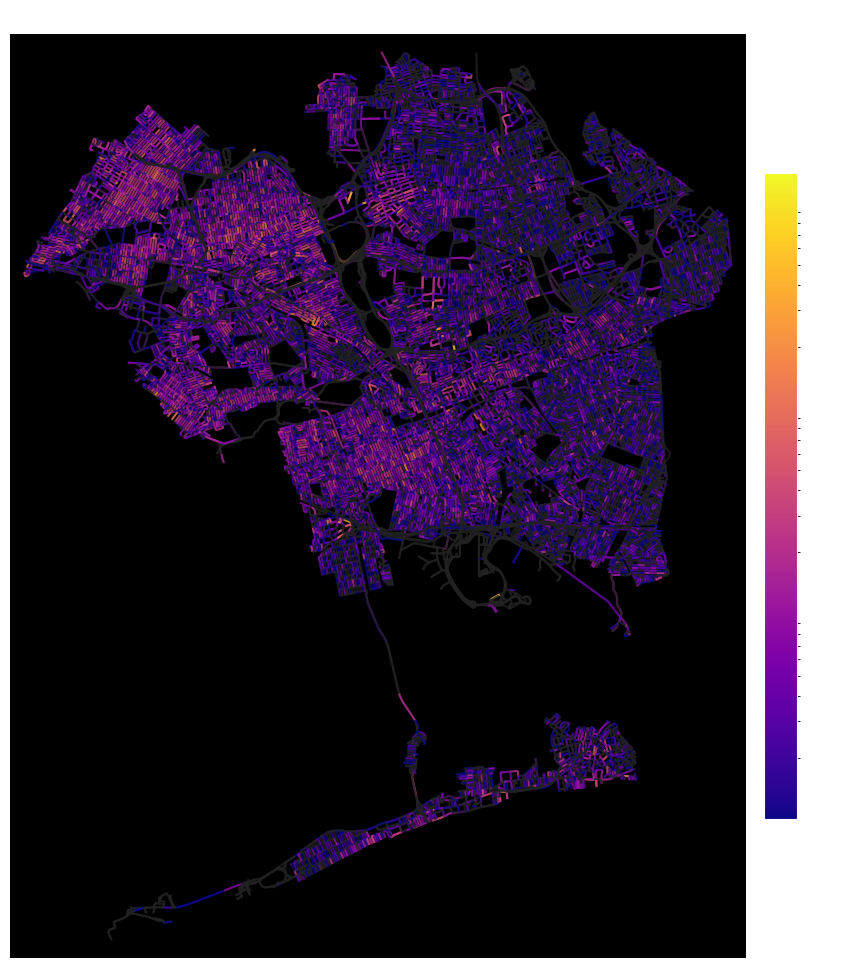

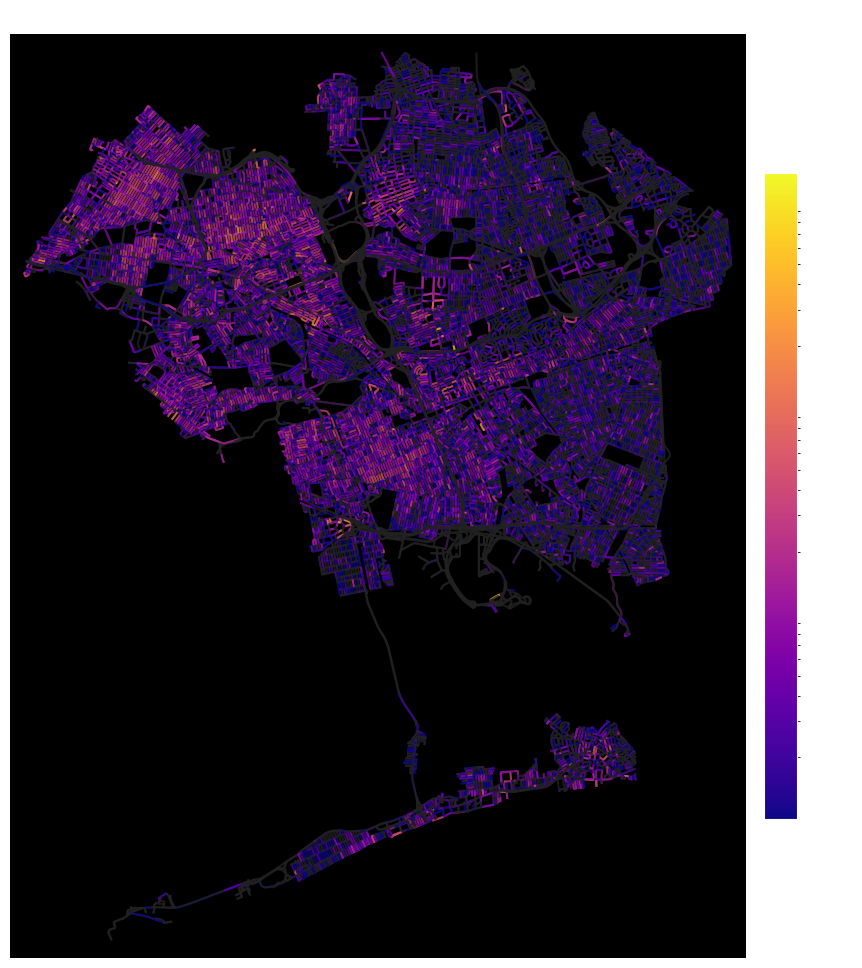

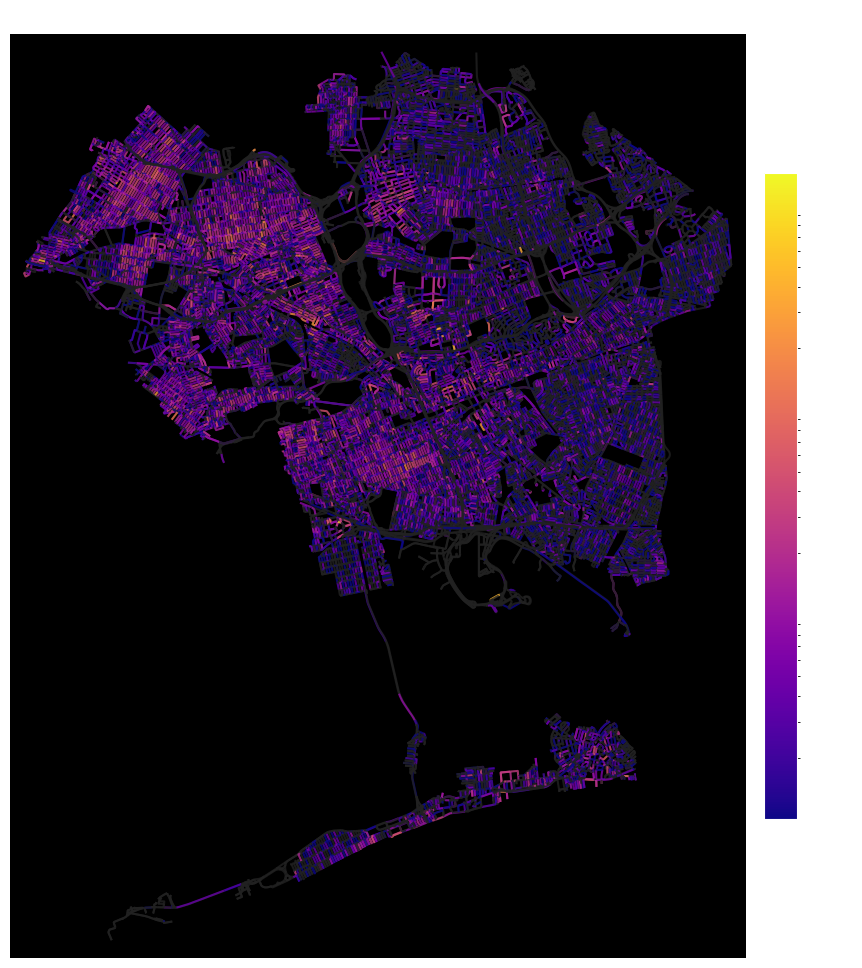

In [20]:
borough_name = "Queens" 
G = None
for month in range(1,13):
  filtered = df_311[df_311["month"] == month].copy()
  G_borough, G = generate_borough(filtered, borough_name, G)
  plot_borough(G_borough, borough_name, month)

In [39]:
df_311[df_311["month"] == 1]

,Unnamed: 0,unique_key,created_date,closed_date,complaint_type,descriptor,agency,latitude,longitude,borough,location_type,incident_zip,day,month,day_of_week,hour
0,0,56417527,2023-01-01 00:00:09,2023-01-01 00:36:06,Illegal Fireworks,n a,NYPD,40.640915,-73.973642,BROOKLYN,Street/Sidewalk,11218.0,2023-01-01,1,6,0
1,1,56416252,2023-01-01 00:00:42,2023-01-01 17:34:15,Noise - Residential,loud music party,NYPD,40.853848,-73.917709,BRONX,Residential Building/House,10453.0,2023-01-01,1,6,0
2,2,56418795,2023-01-01 00:00:45,2023-01-01 01:24:10,Illegal Parking,posted parking sign violation,NYPD,40.754875,-74.000747,MANHATTAN,Street/Sidewalk,10001.0,2023-01-01,1,6,0
3,3,56418136,2023-01-01 00:00:46,2023-01-01 01:01:43,Noise - Residential,loud music party,NYPD,40.620665,-73.926040,BROOKLYN,Residential Building/House,11234.0,2023-01-01,1,6,0
4,4,56413896,2023-01-01 00:00:57,2023-01-04 15:09:28,Street Condition,blocked construction,DOT,40.849297,-73.910479,BRONX,Street,10453.0,2023-01-01,1,6,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3418902,3512749,60191450,2024-01-31 23:59:00,2024-02-01 22:43:00,Noise - Unspecified,noise: construction before after hours nm,DEP,40.757008,-73.963872,MANHATTAN,NaN,10022.0,2024-01-31,1,2,23
3418903,3512750,60199465,2024-01-31 23:59:03,2024-02-01 00:10:12,Noise - Residential,banging pounding,NYPD,40.699800,-73.983616,BROOKLYN,Residential Building/House,11201.0,2024-01-31,1,2,23
3418904,3512751,60200052,2024-01-31 23:59:05,2024-04-23 09:05:22,Taxi Complaint,driver complaint passenger,TLC,40.648320,-73.788281,QUEENS,Street,11430.0,2024-01-31,1,2,23
3418905,3512753,60194494,2024-01-31 23:59:13,2024-02-02 17:36:50,Heat/Hot Water,apartment only,HPD,40.854559,-73.900158,BRONX,RESIDENTIAL BUILDING,10457.0,2024-01-31,1,2,23


In [17]:
if not G:
  print("hi")

hi


# 2. Prediction

Use combined dataset of 311 service requests and weather data to use for classification models

In [9]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, HistGradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder

In [10]:
le = LabelEncoder()
df_merged_reduced['borough_encoded'] = le.fit_transform(df_merged_reduced['borough'].astype(str))
df_merged_reduced['location_type_encoded'] = le.fit_transform(df_merged_reduced['location_type'].astype(str))

In [ ]:
features = [
  "month",
  "day_of_week",
  "hour",
  "latitude",
  "longitude",
  "location_type_encoded",
  "borough_encoded",
  "tavg",
  "prcp",
  "snow"
]

y = df_merged_reduced.complaint_type
X = df_merged_reduced[features]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [ ]:
['Snow Or Ice', 'Street Condition', 'Damaged Tree', 'Heat/Hot Water', 'Water Leak', 'Standing Water', 'Sewer']

## 3.1 Random Forest

In [20]:
# 7. Model Training
rf = RandomForestClassifier(n_estimators=50, random_state=42, max_depth=15, min_samples_leaf=10, n_jobs=2)
rf.fit(X_train, y_train)

# 8. Evaluation
predictions = rf.predict(X_test)
print(classification_report(y_test, predictions))

                                precision    recall  f1-score   support

             Abandoned Vehicle       0.83      0.10      0.17     40288
                   Air Quality       0.91      0.30      0.45      6258
                  Animal-Abuse       0.91      0.04      0.07      5340
                     Appliance       0.00      0.00      0.00     13535
              Blocked Driveway       0.68      0.04      0.08    100743
                  Building/Use       0.35      0.12      0.17     11755
            Consumer Complaint       0.86      0.99      0.92     12262
                Curb Condition       1.00      0.00      0.00      3936
                  Damaged Tree       0.26      0.23      0.24     18146
                   Dead Animal       0.00      0.00      0.00      6103
               Dead/Dying Tree       1.00      0.00      0.00      6235
             Derelict Vehicles       0.27      0.69      0.39     27343
               Dirty Condition       0.41      0.76      0.54  

## 3.2 Hist Gradient boosting classifier

In [21]:
hgb = HistGradientBoostingClassifier(
        max_iter=100,
        random_state=42
        # optimized for speed/memory automatically
    )

hgb.fit(X_train, y_train)

predictions = hgb.predict(X_test)
print(classification_report(y_test, predictions))

                                precision    recall  f1-score   support

             Abandoned Vehicle       0.80      0.08      0.15     40288
                   Air Quality       0.82      0.30      0.44      6258
                  Animal-Abuse       0.33      0.05      0.09      5340
                     Appliance       0.21      0.00      0.00     13535
              Blocked Driveway       0.65      0.03      0.05    100743
                  Building/Use       0.31      0.15      0.20     11755
            Consumer Complaint       1.00      1.00      1.00     12262
                Curb Condition       0.16      0.06      0.08      3936
                  Damaged Tree       0.23      0.20      0.22     18146
                   Dead Animal       0.14      0.01      0.02      6103
               Dead/Dying Tree       0.12      0.08      0.10      6235
             Derelict Vehicles       0.30      0.57      0.40     27343
               Dirty Condition       0.44      0.67      0.53  

## 3.3 Logistic regression

In [16]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

In [22]:
lr = make_pipeline(
  StandardScaler(), # Scale data for LogReg to work correctly
  LogisticRegression(max_iter=1000, n_jobs=2)
)

lr.fit(X_train, y_train)

predictions = lr.predict(X_test)
print(classification_report(y_test, predictions))

                                precision    recall  f1-score   support

             Abandoned Vehicle       0.00      0.00      0.00     40288
                   Air Quality       0.00      0.00      0.00      6258
                  Animal-Abuse       0.00      0.00      0.00      5340
                     Appliance       0.00      0.00      0.00     13535
              Blocked Driveway       0.22      0.01      0.01    100743
                  Building/Use       0.11      0.02      0.04     11755
            Consumer Complaint       0.00      0.00      0.00     12262
                Curb Condition       0.00      0.00      0.00      3936
                  Damaged Tree       0.21      0.03      0.06     18146
                   Dead Animal       0.00      0.00      0.00      6103
               Dead/Dying Tree       0.00      0.00      0.00      6235
             Derelict Vehicles       0.04      0.00      0.01     27343
               Dirty Condition       0.17      0.01      0.01  

In [18]:
X_train[X_train.isnull().any(axis=1)]

,month,day_of_week,hour,latitude,longitude,location_type_encoded,incident_zip,borough_encoded,tavg,prcp,snow
5461699,9,0,1,40.834253,-73.851223,81,NaN,0,19.5,0.0,0.0
2467577,10,1,21,40.713152,-74.003769,81,NaN,2,13.0,0.0,0.0
2190916,9,1,8,40.727031,-73.807781,80,NaN,5,18.1,0.0,0.0
2156904,9,4,10,40.764816,-73.985188,80,NaN,5,17.3,0.0,0.0
2995320,12,3,11,40.735150,-73.875284,45,NaN,3,2.8,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
1963353,8,3,12,40.733422,-74.002908,81,NaN,2,21.2,2.4,0.0
1070502,5,0,1,40.724329,-73.997705,81,NaN,2,18.0,0.0,0.0
1411634,6,4,23,40.719317,-74.006887,81,NaN,2,20.0,4.1,0.0
5796939,10,0,7,40.793918,-73.972325,81,NaN,2,19.8,0.0,0.0


# 3: Creating street network

In [ ]:
def generate_borough(data, borough_name, G=None):
  df = data[data['borough'] == borough_name.upper()].copy()
  place_name = f"{borough_name.title()}, New York City, New York, USA"

  if not G:
    try:
      # Simplify=True cleans up complex intersections which helps with analysis
      G = ox.graph_from_place(place_name, network_type='drive', simplify=True)
      print("✅ Graph downloaded successfully!")
    except Exception as e:
      print(f"❌ Error downloading graph: {e}")
      # Fallback for complex names (sometimes 'Brooklyn' needs 'Kings County')
      print("Try hardcoding specific place names if this fails.")

  G_borough = ox.project_graph(G)

  gdf_nodes, gdf_edges = ox.graph_to_gdfs(G_borough)

  # print(f"Graph Stats:")
  # print(f" - Nodes (Intersections): {len(gdf_nodes)}")
  # print(f" - Edges (Street Segments): {len(gdf_edges)}")

  geometry = [shapely.geometry.Point(x, y) for x, y in zip(df['longitude'], df['latitude'])]

  # 2. Create the GeoDataFrame
  gdf_complaints = gpd.GeoDataFrame(df, geometry=geometry, crs="EPSG:4326")

  gdf_complaints_proj = gdf_complaints.to_crs(G_borough.graph['crs'])

  nearest_edges = ox.nearest_edges(
    G_borough, 
    gdf_complaints_proj.geometry.x, 
    gdf_complaints_proj.geometry.y
  )

  gdf_complaints_proj['nearest_edge'] = nearest_edges

  edge_counts = gdf_complaints_proj['nearest_edge'].value_counts()

  # Initialize a new attribute 'complaint_count' on all edges to 0
  for u, v, k, data in G_borough.edges(keys=True, data=True):
      data['complaint_count'] = 0

  # Update the graph with the actual counts
  # We iterate through our counts and update the graph attributes
  max_complaints = 0
  for edge, count in edge_counts.items():
      u, v, k = edge
      # Check if edge exists in graph (safety check)
      if G_borough.has_edge(u, v, key=k):
          G_borough[u][v][k]['complaint_count'] = count
          if count > max_complaints:
              max_complaints = count

  return (G_borough, G)

In [ ]:
def plot_borough(G, borough_name, title=None, log=True):
  if not log:
    ec = ox.plot.get_edge_colors_by_attr(
      G, 
      attr='complaint_count', 
      cmap='plasma',       # Brighter sequential map
      na_color='#222222'   # Dark grey for edges with 0 complaints (blends with black bg)
    )

    # 2. Plot graph with dark background for contrast
    fig, ax = ox.plot_graph(
        G, 
        node_size=0, 
        edge_color=ec, 
        edge_linewidth=1.5, 
        edge_alpha=0.8,      # Increased alpha slightly for visibility
        bgcolor='k',         # Black background makes 'plasma' colors glow
        figsize=(12, 12),
        show=False
    )

    if title:
      ax.set_title(title, color='w', fontsize=15)
    else:
      ax.set_title(f"Heatmap of Service Requests ({borough_name.title()})", color='w', fontsize=15)
    plt.show()
  else:
    # --- Step 1: Prepare Data ---
    edge_values = [data['complaint_count'] for u, v, k, data in G.edges(keys=True, data=True)]

    # Set Scale
    vmax = max(edge_values)
    vmin = 1 

    # --- Step 2: Create Logarithmic Color Mapper ---
    norm = colors.LogNorm(vmin=vmin, vmax=vmax)
    cmap = plt.get_cmap('plasma')
    sm = cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])

    # --- Step 3: Generate Uniform Edge Colors (The Fix) ---
    # We convert the grey string to a tuple so the entire list is (R, G, B, A) tuples
    grey_rgba = colors.to_rgba('#222222') 

    ec = [sm.to_rgba(count) if count > 0 else grey_rgba for count in edge_values]

    # --- Step 4: Plot ---
    fig, ax = ox.plot_graph(
        G, 
        node_size=0, 
        edge_color=ec, 
        edge_linewidth=1.5, 
        edge_alpha=0.8,
        bgcolor='k', 
        figsize=(12, 12),
        show=False
    )

    # --- Step 5: Add Legend ---
    cb = fig.colorbar(sm, ax=ax, shrink=0.7, pad=0.02)
    cb.set_label('Number of Service Requests (Log Scale)', color='white', fontsize=12)
    cb.ax.yaxis.set_tick_params(color='white', labelcolor='white') 
    cb.outline.set_edgecolor('white')

    if title:
      ax.set_title(title, color='w', fontsize=15)
    else:
      ax.set_title(f"Log-Scaled Heatmap of Service Requests ({borough_name.title()})", color='w', fontsize=15)
    plt.show()

## 4.1 Seperate data by borough

In [25]:
df_merged_reduced.borough.unique()

array(['BROOKLYN', 'BRONX', 'MANHATTAN', 'QUEENS', 'STATEN ISLAND',
       'Unspecified'], dtype=object)

In [ ]:
borough_name = "Queens"
G_queens, _ = generate_borough(df_merged_reduced, borough_name)
plot_borough(G_queens, borough_name)

# 4. incorporating networks to model

In [27]:
df_merged_reduced_queens = df_merged_reduced[df_merged_reduced["borough"] == "QUEENS"].copy()


In [ ]:
df_merged_reduced_brookyln = df_merged_reduced[df_merged_reduced["borough"] == "BROOKLYN"].copy()


In [ ]:
df_merged_reduced_bronx = df_merged_reduced[df_merged_reduced["borough"] == "BRONX"].copy()


In [ ]:
df_merged_reduced_staten = df_merged_reduced[df_merged_reduced["borough"] == "STATEN ISLAND"].copy()


In [ ]:
df_merged_reduced_unspecified = df_merged_reduced[df_merged_reduced["borough"] == "Unspecified"].copy()

## 4.2 Create graph

In [28]:

place_name = "Queens, New York City, New York, USA"

try:
  # Simplify=True cleans up complex intersections which helps with analysis
  G = ox.graph_from_place(place_name, network_type='drive', simplify=True)
  print("✅ Graph downloaded successfully!")
except Exception as e:
  print(f"❌ Error downloading graph: {e}")
  # Fallback for complex names (sometimes 'Brooklyn' needs 'Kings County')
  print("Try hardcoding specific place names if this fails.")

✅ Graph downloaded successfully!


In [29]:
betweenness = nx.betweenness_centrality(G, k=100)

def get_graph_features(row):
    # Find nearest node to the complaint
    nearest_node = ox.distance.nearest_nodes(G, row['longitude'], row['latitude'])
    
    # Extract metrics for that node
    node_centrality = betweenness.get(nearest_node, 0)
    node_degree = G.degree[nearest_node]
    
    return pd.Series([node_centrality, node_degree])

In [ ]:
df_merged_reduced_queens['nearest_node'] = ox.distance.nearest_nodes(G, X=df_merged_reduced_queens['longitude'], Y=df_merged_reduced_queens['latitude'])


In [39]:
node_betweenness = nx.betweenness_centrality(G, k=2000, normalized=True)
node_degree = dict(G.degree())

# 4. Create a "Lookup Table" (DataFrame from the graph metrics)
graph_features = pd.DataFrame({
    'node_id': list(G.nodes()),
    'intersection_betweenness': [node_betweenness.get(n, 0) for n in G.nodes()],
    'intersection_complexity': [node_degree.get(n, 0) for n in G.nodes()]
})

In [41]:
# 5. Merge onto your 2 million rows
# This uses a hash map merge (extremely fast)
df_queens_betweenness = df_merged_reduced_queens.merge(graph_features, left_on='nearest_node', right_on='node_id', how='left')


In [ ]:
features = [
  "month",
  "day_of_week",
  "hour",
  "latitude",
  "longitude",
  "location_type_encoded",
  # "incident_zip",
  "tavg",
  "prcp",
  "snow",
  "intersection_betweenness",
  "intersection_complexity"
]

y = df_queens_betweenness.complaint_type
X = df_queens_betweenness[features]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [43]:
# 7. Model Training
rf = RandomForestClassifier(n_estimators=50, random_state=42, max_depth=15, min_samples_leaf=10, n_jobs=2)
rf.fit(X_train, y_train)

# 8. Evaluation
predictions = rf.predict(X_test)
print(classification_report(y_test, predictions))

                                precision    recall  f1-score   support

             Abandoned Vehicle       0.87      0.02      0.04     16139
                   Air Quality       0.79      0.43      0.55      1768
                  Animal-Abuse       1.00      0.01      0.01      1320
                     Appliance       0.00      0.00      0.00      1687
              Blocked Driveway       0.63      0.15      0.25     42146
                  Building/Use       0.37      0.28      0.32      5589
            Consumer Complaint       0.78      0.95      0.86      2967
                Curb Condition       1.00      0.01      0.02      1184
                  Damaged Tree       0.26      0.36      0.31      7072
                   Dead Animal       0.00      0.00      0.00      1949
               Dead/Dying Tree       0.71      0.00      0.00      2949
             Derelict Vehicles       0.26      0.68      0.37      8846
               Dirty Condition       0.44      0.59      0.50  

In [44]:
importances = rf.feature_importances_
feature_imp_df = pd.DataFrame({'Feature': features, 'Gini Importance': importances}).sort_values(
    'Gini Importance', ascending=False)
print(feature_imp_df)

                     Feature  Gini Importance
5      location_type_encoded         0.630210
4                  longitude         0.093183
3                   latitude         0.090468
2                       hour         0.052159
10  intersection_betweenness         0.048321
7                       tavg         0.026175
11   intersection_complexity         0.021656
1                day_of_week         0.014936
0                      month         0.013742
8                       prcp         0.007801
9                       snow         0.001350
6            borough_encoded         0.000000
